In [ ]:
/**********                         CHRISTMAS ANALYSIS (SQL SECTION FIRST)               **************


Author:       Angus Gair 
Reviewers:    
ProductOwner: Julie H
Last updated: 2024-10-16
Version:      1.01v
  
OBJECTIVE: 

        Optimise campaign offer based on budget and target groups

REQUIREMENTS:

            - similar historical campaigns
            - Size of intended auidence

KEY ASSUMPTIONS MADE:
    1. FIXED AUDIENCE SIZE 
      - Reactivation: 1,500,000
      - Priority: 1,200,000
        - We then break this into crest groups


THINGS TO NOTE:

    1. The current version of the model uses a exBoost model to learn redemption behaviour
    2. The model is trained on historical data and is used to predict redemption rates for future campaigns
    3. The model is trained on a dataset that includes the following features:
        - Customer Segment
        - Minimum Basket Spend
        - Points Value
        - Crest Group

    4. Model Selection
        - current model is xgBoostRession, this results in a "Lumpy" optimisation space
        - Purhaps a more linear model would be more appropriate as we are trying to capture how increasing points offered, increases redemption rates
            - Linear Regression: Generalised Additive Model (GAM) with smoothing function
            - Is supplied in the code, but not intergrated into the model

    5. Optimisation Algorithm
        - The current model uses a grid search to find the optimal points value
        - This is a brute force method and is not the most efficient
        - A more efficient method would be to use a bayesian optimisation algorythm or Linear Algebra

WARNINGS:
    - The optimisation process is sensitive to the audience size. If predicting outside of the training data, the model may not be accurate
    - resulting in redemtion rates that are flat.



****************************************************************************************************************************/

/*----------------------------------------------------------------------------------------------------------*/
/*                                Section 1: Data Import and Staging                                        */
/*----------------------------------------------------------------------------------------------------------*/

-- TEMP CAMPAIGN DATA

CREATE OR REPLACE TABLE `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_temp` AS (
  WITH dim_date AS (
    SELECT 
      dd.CalendarDay, -- join key
      dd.BigWFiscalYear,
      dd.BigWFiscalWeekStartDate, 
      dd.BigWFiscalWeekStartDate AS fw_week_start_date, -- for different naming convention in tables
      dd.BigWFiscalWeekEndDate,
      dd.BigWFiscalWeekEndDate AS fw_week_end_date -- for different naming convention in tables
    FROM `gcp-wow-ent-im-wowx-cust-prod.adp_wowx_dm_masterdata_view.dim_date_v` dd 
  ),
  t1 AS (
    SELECT 
      f.*,
      dd.fw_week_end_date
    FROM `gcp-wow-rwds-ai-data-prod.loyalty_car_analytics.fact_campaign_split_view` f 
    JOIN dim_date dd ON f.campaign_start_date = dd.CalendarDay
    WHERE f.campaign_code IN (
      SELECT DISTINCT ocm.campaign_code
      FROM `gcp-wow-rwds-ai-data-prod.rtl_data_model.offer_campaign_master` AS ocm
      JOIN `gcp-wow-rwds-ai-data-prod.rtl_data_model.offer_header` AS oh ON ocm.offer_nbr = oh.offer_nbr
      WHERE ocm.campaign_type IN ('BIGW', 'BIG W')
        AND LEFT(ocm.campaign_code, 3) IN ('WCV', 'WCT')
      ORDER BY 1
    )
  ),
  t2 AS ( -- this just catergorises the customer segment from GROUP1 to Reativate or Priority
    SELECT 
      f.*,
      c.string_field_1 AS CustomerSegment
    FROM t1 f
    LEFT JOIN `gcp-wow-rwds-ai-pobe-dev.angus.cust_grp` c 
      ON f.group02 = c.string_field_0 
      OR f.group03 = c.string_field_0
      OR f.group04 = c.string_field_0
      OR f.group05 = c.string_field_0
      OR f.group06 = c.string_field_0
  )
  SELECT 
    f.campaign_code,
    LEFT(`group08`, 8) AS offer_nbr,
    f.campaign_start_date,
    f.crn,
    CONCAT(campaign_code, campaign_start_date) AS campaign_key,
    GENERATE_UUID() AS unique_id,
    CustomerSegment
  FROM t2 f
);


/*----------------------------------------------------------------------------------------------------------*/
/*                                Section 2: Base table for model                                           */
/*----------------------------------------------------------------------------------------------------------*/

CREATE OR REPLACE TABLE `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_analysis_STG` AS (

/*----------        campaign audience     ----*/

WITH dim_date AS (
  SELECT 
    dd.CalendarDay, -- join key
    dd.BigWFiscalYear,
    dd.BigWFiscalWeekStartDate, 
    dd.BigWFiscalWeekStartDate AS fw_week_start_date, -- for different naming convention in tables
    dd.BigWFiscalWeekEndDate,
    dd.BigWFiscalWeekEndDate AS fw_week_end_date -- for different naming convention in tables
  FROM `gcp-wow-ent-im-wowx-cust-prod.adp_wowx_dm_masterdata_view.dim_date_v` dd 
),

CAMPAIGN_DETS AS (
  SELECT DISTINCT 
    ocm.offer_nbr,
    ocm.offer_nbr AS OfferNumber,
    ocm.offer_name,
    ocm.campaign_code,
    ocm.campaign_type,
    CAST(oh.offer_start_date AS DATE) AS OfferAllocationStartDate,
    CAST(oh.offer_end_date AS DATE) AS OfferAllocationEndDate,
    CAST(oh.offer_start_date AS DATE) AS campaign_start_date,
    CAST(oh.offer_end_date AS DATE) AS campaign_end_date,
    oh.OfferLevelEE,
    oh.minimum_basket_spend,
    offer_level,
    ((COALESCE(oh.Reward_value, oh.multiplier_value) * 2000) / 10) AS points_value,
    dd.fw_week_end_date
  FROM `gcp-wow-rwds-ai-data-prod.rtl_data_model.offer_campaign_master` AS ocm
  JOIN `gcp-wow-rwds-ai-data-prod.rtl_data_model.offer_header` AS oh ON ocm.offer_nbr = oh.offer_nbr
  JOIN dim_date dd ON DATE(oh.offer_start_date) = dd.CalendarDay
  WHERE ocm.campaign_type IN ('BIGW', 'BIG W')
  ORDER BY 1
),

audience_campaign_dets AS (
  SELECT 
    a.*,
    c.campaign_type,
    c.OfferLevelEE,
    c.minimum_basket_spend,
    c.offer_level,
    c.points_value,
    dd.fw_week_end_date
  FROM `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_temp` a
  LEFT JOIN CAMPAIGN_DETS c ON a.offer_nbr = c.offer_nbr AND a.campaign_code = c.campaign_code
  JOIN dim_date dd ON DATE(a.campaign_start_date) = dd.CalendarDay
),

bc AS (
  SELECT DISTINCT 
    ocm.campaign_code
  FROM `gcp-wow-rwds-ai-data-prod.rtl_data_model.offer_campaign_master` AS ocm
  JOIN `gcp-wow-rwds-ai-data-prod.rtl_data_model.offer_header` AS oh ON ocm.offer_nbr = oh.offer_nbr
  WHERE ocm.campaign_type IN ('BIGW', 'BIG W')
    AND LEFT(ocm.campaign_code, 3) IN ('WCV', 'WCT')
  ORDER BY 1
),

metrics AS (
  SELECT 
    f.crn,
    f.campaign_code,
    f.campaign_start_date,
    f.campaign_end_date,
    f.offer_nbr,
    dd.fw_week_end_date,
    CONCAT(f.campaign_code, ' - ', f.campaign_start_date) AS campaign_key,
    MAX(f.crest_groupname) AS crest_groupname, 
    MAX(f.crest_segname) AS crest_segname, 
    MAX(f.allocate) AS allocate, 
    MAX(f.activated) AS activated, 
    MAX(f.redeemed) AS redeemed
  FROM `gcp-wow-rwds-ai-data-prod.loyalty_bi_analytics.vw_bi_campaign_offer` f
  JOIN dim_date dd ON f.campaign_start_date = dd.CalendarDay
  JOIN bc ON f.campaign_code = bc.campaign_code
  GROUP BY 1, 2, 3, 4, 5, 6, 7
),

joined_data AS (
  SELECT 
    a.*,
    m.campaign_start_date AS campaign_start_date_vwbi,
    m.campaign_end_date AS campaign_end_date_vwbi,
    m.crest_groupname,
    m.crest_segname,
    m.allocate,
    m.activated,
    m.redeemed
  FROM audience_campaign_dets a
  JOIN metrics m ON a.crn = m.crn AND a.offer_nbr = m.offer_nbr AND a.fw_week_end_date = m.fw_week_end_date
),

srd_crn AS (
  SELECT 
    crn,    
    campaign_code,
    offer_nbr, 
    DATE(start_txn_date) AS start_txn_date,
    SUM(points_cost_excl_gst_sales) AS cost
  FROM `gcp-wow-rwds-ai-data-prod.loyalty_bi_analytics.vw_bi_sales_reward_details` csrd
  WHERE offer_nbr IN (SELECT DISTINCT offer_nbr FROM metrics)
    AND LENGTH(crn) > 3
  GROUP BY 1, 2, 3, 4
),

final_data AS (
  SELECT 
    jd.*,
    cost
  FROM joined_data jd
  LEFT JOIN srd_crn sc ON jd.crn = sc.crn AND jd.campaign_code = sc.campaign_code AND jd.offer_nbr = sc.offer_nbr
    AND sc.start_txn_date BETWEEN jd.campaign_start_date_vwbi AND jd.campaign_end_date_vwbi
)

SELECT 
  f.* 
FROM final_data f;



/*----------------------------------------------------------------------------------------------------------*/
/*                                Section 3: Modelling Dataset                                              */
/*----------------------------------------------------------------------------------------------------------*/

SELECT * FROM `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_analysis_STG` A
WHERE OfferLevelEE = 'VARIABLE_POINTS_PRODUCTS'
LIMIT 100;

CREATE OR REPLACE TABLE `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_modelData2` AS (
  SELECT 
    CONCAT(campaign_code, ' - ', offer_nbr, ' - ', campaign_start_date) AS campaign_key,
    minimum_basket_spend,
    points_value, 
    crest_groupname,     
    OfferLevelEE, 
    CustomerSegment,
    SUM(cost) AS cost,
    COUNT(DISTINCT crn) AS Audience,
    COUNT(DISTINCT activated) AS Activations,
    COUNT(DISTINCT redeemed) AS Redeemer_flag,        
    COUNT(DISTINCT activated) / COUNT(DISTINCT crn) AS ActivationRate,
    COUNT(DISTINCT redeemed) / COUNT(DISTINCT crn) AS RedemptionRate 
  FROM `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_analysis_STG`
  WHERE OfferLevelEE = 'FIXED_POINTS_BASKET'
    AND customersegment IS NOT NULL
  GROUP BY 1, 2, 3, 4, 5, 6
  ORDER BY 1, 2
);
-- Check for duplicates using unique_id
SELECT 
  unique_id,
  COUNT(*) AS count
FROM `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_analysis_STG`
GROUP BY unique_id
HAVING count > 1
LIMIT 100;


In [1]:
## switch to python to do the rest of the analysis

# required 
import pandas as pd
import numpy as np
from google.cloud import bigquery
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
from itertools import product
from sklearn.preprocessing import StandardScaler
import pandas_gbq
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


In [2]:
## Import data from BigQuery and save to CSV
# client = bigquery.Client(project='gcp-wow-rwds-ai-pobe-dev')
# sql = """
# SELECT * 
# FROM `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_modelData2` 
# """
# modelData = client.query(sql).to_dataframe()
# modelData.to_csv('modelData.csv', index=False)
# 
## Re-import the CSV
modelData = pd.read_csv('modelData.csv')

# Dataset Summary

# 1. Column Headers
print("Column Headers:")
print(modelData.columns.tolist())

# 2. Data Types
print("\nData Types:")
print(modelData.dtypes)

# 3. Missing Values
print("\nMissing Values:")
print(modelData.isnull().sum())

# 4. Unique Values
print("\nUnique Values:")
print({col: modelData[col].nunique() for col in modelData.columns})

# 5. Summary Statistics
print("\nSummary Statistics:")
print(modelData.describe(include='all'))

# Display first few rows
print(modelData.head())



Column Headers:
['campaign_key', 'minimum_basket_spend', 'points_value', 'crest_groupname', 'OfferLevelEE', 'CustomerSegment', 'cost', 'Audience', 'Activations', 'Redeemer_flag', 'ActivationRate', 'RedemptionRate']

Data Types:
campaign_key             object
minimum_basket_spend    float64
points_value            float64
crest_groupname          object
OfferLevelEE             object
CustomerSegment          object
cost                    float64
Audience                  int64
Activations               int64
Redeemer_flag             int64
ActivationRate          float64
RedemptionRate          float64
dtype: object

Missing Values:
campaign_key              0
minimum_basket_spend      0
points_value              0
crest_groupname           0
OfferLevelEE              0
CustomerSegment           0
cost                    278
Audience                  0
Activations               0
Redeemer_flag             0
ActivationRate            0
RedemptionRate            0
dtype: int64

Unique 

In [3]:
from sklearn.model_selection import train_test_split

In [4]:
## Data a Preprocessing
xvars = ['minimum_basket_spend', 'points_value','CustomerSegment' , 'crest_groupname'] 
X = modelData[xvars]
y = modelData['RedemptionRate']



## Should probably centre and scale the data here too

## Encode categorical features (convert to integers)
label_encoders = {}
for column in X.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    X[column] = le.fit_transform(X[column])
    label_encoders[column] = le

# Create train-test split (20% test size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


C:\Users\angus_6v2ij9a\AppData\Local\Temp\ipykernel_31520\2996294299.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[column] = le.fit_transform(X[column])
C:\Users\angus_6v2ij9a\AppData\Local\Temp\ipykernel_31520\2996294299.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[column] = le.fit_transform(X[column])


In [5]:
from sklearn.model_selection import GridSearchCV

xgb_model = XGBRegressor()

params = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid_search = GridSearchCV(estimator=xgb_model, param_grid=params, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

In [32]:
best_params

{'colsample_bytree': 1.0,
 'learning_rate': 0.05,
 'max_depth': 5,
 'n_estimators': 200,
 'subsample': 1.0}

In [59]:
# option 1: non log transformed model (default)
# Train XGBoost Regressor

# Updated parameter dictionary
param = {
    'objective': 'reg:squarederror',
    'learning_rate': 0.01,
    'lambda': 1,  # L2 regularization term
    'alpha': 0.5,  # L1 regularization term
    'max_depth': 3,  # Maximum depth of tree
    'subsample': 0.8,  # Subsample ratio of the training instances
    'colsample_bytree': 0.8,  # Subsample ratio of columns when constructing each tree
    'n_estimators': 100
}

xgb_model = XGBRegressor(**best_params)
xgb_model.fit(X, y)
y_pred = xgb_model.predict(X)
print("Predicted Values (Original Scale):", y_pred[:10])
# Create train-test split (20% test size)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model on the training data
#xgb_model.fit(X_train, y_train)

# Predict on the test data
#y_pred_test = xgb_model.predict(X_test)

# Display some predicted values for review
print("Predicted Values (Test Set):", y_pred_test[:10])

Predicted Values (Original Scale): [0.01229621 0.0152237  0.02138852 0.00230647 0.1435303  0.01311756
 0.09713522 0.10383631 0.0157837  0.09152562]


NameError: name 'y_pred_test' is not defined

In [51]:
import xgboost as xgb

#dtrain = xgb.DMatrix(X, label=y)
#bst = xgb.train(param, dtrain, num_boost_round=1000, evals=[(dtrain, 'train')],
#                early_stopping_rounds=50)  # Early stopping
# After obtaining predictions
predictions = y_pred #bst.predict(xgb.DMatrix(X))

# Apply rolling average to smooth predictions
smoothed_predictions = pd.Series(predictions).rolling(window=3, min_periods=1).mean()

In [6]:
## option 2: log transformed model

## 1. Apply logarithmic transformation to the target variable
# y_log_transformed = np.log(y + 1)  # Add 1 to avoid log(0), if necessary

## 2. Train XGBoost Regressor on the transformed target
# gb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=5, learning_rate=0.1)
# gb_model.fit(X, y_log_transformed)
# xgb_model.fit(X, y)

## 3. Make predictions
#y_log_pred = xgb_model.predict(X)

## 4. Apply the inverse transformation to get predictions in the original scale
# y_pred = np.exp(y_log_pred) - 1  # Subtract 1 if you added it during transformation

## Displaying some predicted values for review
# print("Predicted Values (Original Scale):", y_pred[:10])

## Train XGBoost Regressor
#xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=5, learning_rate=0.1)
#xgb_model.fit(X, y)

Predicted Values (Original Scale): [0.0120542  0.01512218 0.02130961 0.00244617 0.14194071 0.01285946
 0.09661448 0.10284579 0.01560497 0.09054756]


In [52]:
## OPTIMISER SECTION BEGIN: 
## THIS PART SHOULD BE REPLACE WITH ONE OF THE OTHER OPTIMISER METHODS OUTLINED ABOVE 


## Create a prediction set to form a grid of possible values to optimise over
# Generate all combinations of CustomerSegment and crest_groupname, points_value and minimum_basket_spend
df_CustomerSegment = pd.DataFrame({
    'CustomerSegment': ['Priority', 'Reactivate']
})


# Create a DataFrame for crest_groupname
df_crest_groupname = pd.DataFrame({
    'crest_groupname': ['Conscious', 'Unclassified', 'Essential', 'Traditional', 'Refined', 'Savers']
})

# Range of points_value and cost
df_points_value = np.arange(100, 3501, 5)

# Generate minimum_basket_spend ranging from 30 to 100 with increments of 10
df_minimum_basket_spend = np.arange(30, 151, 5)

# Create all possible combinations of the features

combinations = list(product(
    df_CustomerSegment['CustomerSegment'],
    df_crest_groupname['crest_groupname'],
    df_points_value,
    df_minimum_basket_spend
))

# Create a DataFrame from combinations
df_combinations = pd.DataFrame(combinations, columns=['CustomerSegment', 'crest_groupname', 'points_value', 'minimum_basket_spend']) 

# Create a DataFrame with the detailed segment data
list_audience_sizes = [
    ('Priority', 'Conscious', 152511/10),
    ('Priority', 'Essential', 124815/10),
    ('Priority', 'Refined', 83679/10),
    ('Priority', 'Savers', 410796/10),
    ('Priority', 'Traditional', 294266/10),
    ('Priority', 'Unclassified', 133929/10),
    ('Reactivate', 'Conscious', 201469/10),
    ('Reactivate', 'Essential', 183190/10),
    ('Reactivate', 'Refined', 152187/10),
    ('Reactivate', 'Savers', 246018/10),
    ('Reactivate', 'Traditional', 343725/10),
    ('Reactivate', 'Unclassified', 373409/10)
]

# Convert the list to a DataFrame
df_audience_sizes = pd.DataFrame(list_audience_sizes, columns=['CustomerSegment', 'crest_groupname', 'Audience'])

# Create a dictionary for audience sizes with a tuple of (CustomerSegment, CrestGroupName) as the key
audience_sizes_dict = {
    (row['CustomerSegment'], row['crest_groupname']): row['Audience']
    for _, row in df_audience_sizes.iterrows()
}


In [53]:
# Map audience sizes to the CustomerSegment and CrestGroupName columns
df_combinations['Audience'] = df_combinations.apply(
    lambda row: audience_sizes_dict.get((row['CustomerSegment'], row['crest_groupname']), float('nan')),
    axis=1
)

# lOG TRANSFORM THE AUDIENCE SIZE (TESTING)
# df_combinations['ln_Audience'] = np.log(df_audience_sizes['Audience'])

# Encode categorical columns in the combinations DataFrame
for column in df_combinations.select_dtypes(include=['object']).columns:
    le = label_encoders[column]
    df_combinations[column] = le.transform(df_combinations[column])
    

In [54]:
# Predict redemption rates using the trained XGBoost model

## optional log transformation step: predict log transformation redemption same as model training
# df_combinations['log_pred_RedemptionRate'] = xgb_model.predict(df_combinations[['minimum_basket_spend', 'points_value', 'CustomerSegment', 'crest_groupname']])
## convert back to original scale
# df_combinations['pred_RedemptionRate'] = np.exp(df_combinations['log_pred_RedemptionRate']) - 1 
df_combinations['pred_RedemptionRate'] = smoothed_predictions


In [55]:

# Create a new column for predicted redeemers
df_combinations['pred_Redeemers'] = (df_combinations['pred_RedemptionRate']) * df_combinations['Audience']

# Create a new column for total cost
df_combinations['TotalCost'] = (df_combinations['points_value'] / 200) * df_combinations['pred_Redeemers']

# Display the first few rows of the prediction set
print(df_combinations.head())

# Convert back to original categorical values
for column, le in label_encoders.items():
    df_combinations[column] = le.inverse_transform(df_combinations[column])

## END OF OPTIMISER SECTION: 

   CustomerSegment  crest_groupname  points_value  minimum_basket_spend  \
0                0                0           100                    30   
1                0                0           100                    35   
2                0                0           100                    40   
3                0                0           100                    45   
4                0                0           100                    50   

   Audience  pred_RedemptionRate  pred_Redeemers   TotalCost  
0   15251.1             0.019971      304.578923  152.289462  
1   15251.1             0.019971      304.578923  152.289462  
2   15251.1             0.025204      384.381212  192.190606  
3   15251.1             0.024188      368.888144  184.444072  
4   15251.1             0.040741      621.338186  310.669093  


In [ ]:
## ALTERNATIVE OPTIMISER METHODS BELOW AND MODEL BELOW
## Generalized Additive Model (GAM) - could be a better solution, the result is a smooth function between offer value and redemption rate

# from pygam import GAM, LinearGAM, s, f
# from scipy.optimize import linprog
# 
# 
#  ## Fit the GAM model
# gam = GAM(s(0) + s(1) + s(2), link='log').fit(X, y)
# predicted_response_rates = gam.predict(X)
# 
# # Ensure no negative response rates
# predicted_response_rates = np.clip(predicted_response_rates, 0, None)
# 
# # Calculate cost per redemption
# cost_per_redemption = modelData['cost'].astype(float) / modelData['Audience'].astype(float)
# c = cost_per_redemption / predicted_response_rates

# # THIS IS WHAT I ORIGINALLY HAD PLANNED TO USE FOR THE OPTIMISER
# # Handle potential infinite/nan values in the cost vector
# c = np.where(np.isfinite(c), c, np.nan)
# c = np.nan_to_num(c, nan=np.nanmax(c) + 1)
# 
# # Budget constraint
# A_eq = [1] * len(c)
# b_eq = [12000000]  # Full budget to spend
# 
# # Bounds to ensure minimum basket and points value constraints
# bounds = [(40, 100)] * len(X['minimum_basket_spend']) + [(500, 3000)] * len(X['points_value']) + [(0, 1)] * len(X['CustomerSegment'])
# 
# # Linear programming optimization
# result = linprog(c, A_eq=[A_eq], b_eq=b_eq, bounds=[(0, None)] * len(c), method='highs')
# 
# # Check if the optimization was successful
# if result.success:
#     optimized_allocation = result.x
#     modelData.loc[:, 'Optimized_Spend_Proportion'] = optimized_allocation
# 
#     # Extract optimized minimum spend and points value
#     optimized_results = modelData[['minimum_basket_spend', 'points_value', 'Optimized_Spend_Proportion']]
#     optimized_results = optimized_results[optimized_results['Optimized_Spend_Proportion'] > 0]
# 
#     print("Optimized Results:")
#     print(optimized_results)
# else:
#     print(f"Optimization failed: {result.message}")
# 

In [10]:
## WRITE TO GCP

## Model and predict redemption rates complete
## NOTE: THE INTENT OF THIS METHODOLOGY IS TO THEN AGGREGATE BACK UP TO THE CUSTOMER SEGMENT LEVEL (REACTIVATE, PRIORITY) AND THEN TO THE TOTAL LEVEL (1.5M and 1.2M)

## Load the DataFrame back to BigQuery
table_id = 'gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_predictions'
df_combinations.to_gbq(table_id, project_id='gcp-wow-rwds-ai-pobe-dev', if_exists='replace')

print("Predictions saved to BigQuery.")

## next step is to find the optimal values for the points value and minimum basket spend
## this next step is just filtering and could be done with a pivot table

C:\Users\angus_6v2ij9a\AppData\Local\Temp\ipykernel_61200\412466174.py:8: FutureWarning: to_gbq is deprecated and will be removed in a future version. Please use pandas_gbq.to_gbq instead: https://pandas-gbq.readthedocs.io/en/latest/api.html#pandas_gbq.to_gbq
  df_combinations.to_gbq(table_id, project_id='gcp-wow-rwds-ai-pobe-dev', if_exists='replace')
C:\Users\angus_6v2ij9a\AppData\Roaming\Python\Python312\site-packages\google\auth\_default.py:76: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


KeyboardInterrupt: 

In [56]:
## Pivot the table so that CustomerSegment becomes columns
pivot_table = df_combinations.pivot_table(
    index=['minimum_basket_spend', 'points_value'],
    columns='CustomerSegment',
    values=['Audience','pred_RedemptionRate', 'pred_Redeemers', 'TotalCost'],
    aggfunc={ 'Audience': 'sum', 'pred_RedemptionRate': 'mean', 'pred_Redeemers': 'sum', 'TotalCost': 'sum'}
)

## Flatten the multi-level column index
pivot_table.columns = ['_'.join(col).strip() for col in pivot_table.columns.values]

## Reset index to make it flat
pivot_table.reset_index(inplace=True)

## Show the resulting pivot table
print(pivot_table)

       minimum_basket_spend  points_value  Audience_Priority  \
0                        30           100           119999.6   
1                        30           105           119999.6   
2                        30           110           119999.6   
3                        30           115           119999.6   
4                        30           120           119999.6   
...                     ...           ...                ...   
17020                   150          3480           119999.6   
17021                   150          3485           119999.6   
17022                   150          3490           119999.6   
17023                   150          3495           119999.6   
17024                   150          3500           119999.6   

       Audience_Reactivate  TotalCost_Priority  TotalCost_Reactivate  \
0                 149999.8          152.289462                   0.0   
1                 149999.8          277.060622                   0.0   
2              

In [57]:
## stripe out spaces in column names and replace with '_' for pivot_table
## add new columns to pivot_table TotalCost and TotalRedeemers as TotalCost =  TotalCost_Group_3_BIGW_Lapsed + TotalCost_Group_BIGW_Active
## do the same for TotalRedeemers

# Add new columns for TotalCost and TotalRedeemers
pivot_table['TotalCost'] = pivot_table['TotalCost_Reactivate'] + pivot_table['TotalCost_Priority']
pivot_table['TotalRedeemers'] = pivot_table['pred_Redeemers_Priority'] + pivot_table['pred_Redeemers_Reactivate']
pivot_table['TotalAudience'] = pivot_table['Audience_Priority'] + pivot_table['Audience_Reactivate']

# Display the pivot table
print(pivot_table)

       minimum_basket_spend  points_value  Audience_Priority  \
0                        30           100           119999.6   
1                        30           105           119999.6   
2                        30           110           119999.6   
3                        30           115           119999.6   
4                        30           120           119999.6   
...                     ...           ...                ...   
17020                   150          3480           119999.6   
17021                   150          3485           119999.6   
17022                   150          3490           119999.6   
17023                   150          3495           119999.6   
17024                   150          3500           119999.6   

       Audience_Reactivate  TotalCost_Priority  TotalCost_Reactivate  \
0                 149999.8          152.289462                   0.0   
1                 149999.8          277.060622                   0.0   
2              

In [58]:
# Define the budget constraint
budget = 700000

# Define the upper and lower bounds for points_value and minimum_basket_spend
points_value_lower_bound = 1200
points_value_upper_bound = 3000
minimum_basket_spend_lower_bound = 35
minimum_basket_spend_upper_bound = 100

# Filter the combinations based on all constraints
filtered_df = pivot_table[
    (pivot_table['TotalCost'] < budget) &
    (pivot_table['points_value'] >= points_value_lower_bound) &
    (pivot_table['points_value'] <= points_value_upper_bound) &
    (pivot_table['minimum_basket_spend'] >= minimum_basket_spend_lower_bound) &
    (pivot_table['minimum_basket_spend'] <= minimum_basket_spend_upper_bound)
]

# Find the combination that maximizes TotalRedeemers
optimal_combination = filtered_df.loc[filtered_df['TotalRedeemers'].idxmax()]

# Display the optimal combination
print("Optimal Combination:")
# Format the numbers
formatted_combination = optimal_combination.copy()
for col in formatted_combination.index:
    if formatted_combination[col] >= 1:
        formatted_combination[col] = f"{formatted_combination[col]:,.0f}"
    else:
        formatted_combination[col] = f"{formatted_combination[col]:.3%}"

print(formatted_combination)

Optimal Combination:
minimum_basket_spend                 35
points_value                      1,200
Audience_Priority               120,000
Audience_Reactivate             150,000
TotalCost_Priority               0.000%
TotalCost_Reactivate             0.000%
pred_Redeemers_Priority          0.000%
pred_Redeemers_Reactivate        0.000%
pred_RedemptionRate_Priority       nan%
TotalCost                        0.000%
TotalRedeemers                   0.000%
TotalAudience                   269,999
Name: 901, dtype: object


C:\Users\angus_6v2ij9a\AppData\Local\Temp\ipykernel_61200\2129657019.py:28: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '35' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



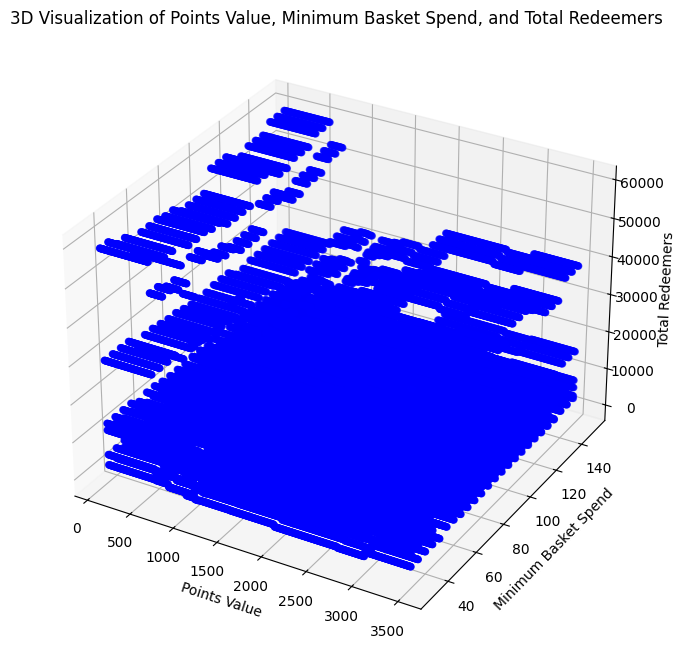

In [15]:
# Visualise df_combinations for points_value, minimum_basket_spend, TotalRedeemers in a single plot
# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

filtered_df_comb = df_combinations[df_combinations['CustomerSegment'] == 'Priority']

# Plotting the data
ax.scatter(
    filtered_df_comb['points_value'],
    filtered_df_comb['minimum_basket_spend'],
    filtered_df_comb['pred_Redeemers'],
    c='b',  # color
    marker='o'  # shape
)

# Setting labels and title
ax.set_xlabel('Points Value')
ax.set_ylabel('Minimum Basket Spend')
ax.set_zlabel('Total Redeemers')
ax.set_title('3D Visualization of Points Value, Minimum Basket Spend, and Total Redeemers')

# Show the plot
plt.show()

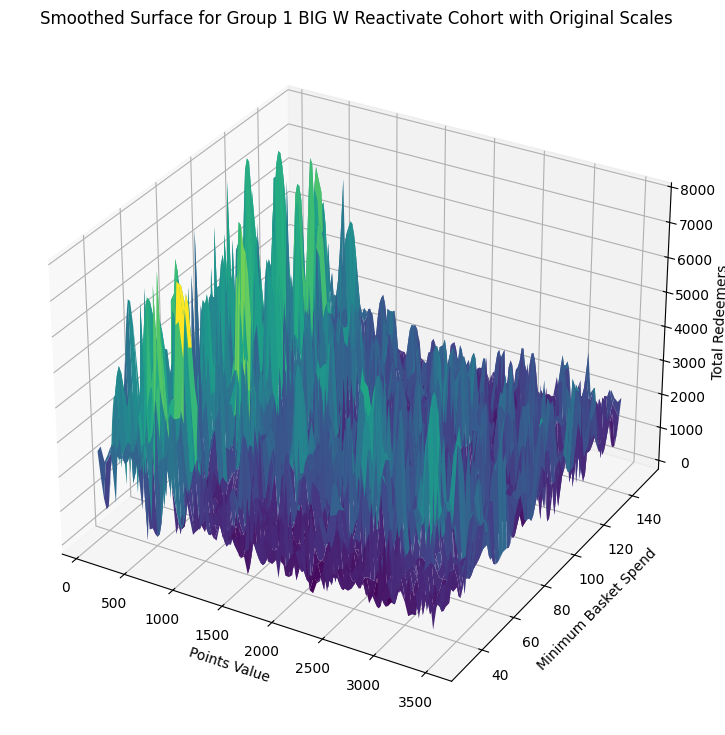

In [16]:
# THIS PART TURN THE 2D PLOT INTO A SURFACE (MAIFOLD) PLOT

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from scipy.interpolate import griddata

# Assume df_combinations is your DataFrame 
filtered_df = df_combinations[df_combinations['CustomerSegment'] == 'Reactivate']

points = filtered_df[['points_value', 'minimum_basket_spend']].values
values = filtered_df['pred_Redeemers'].values

# Apply PCA
pca = PCA(n_components=2)
points_reduced = pca.fit_transform(points)

# Create grid values for interpolation
grid_x, grid_y = np.mgrid[
    points_reduced[:,0].min():points_reduced[:,0].max():100j, 
    points_reduced[:,1].min():points_reduced[:,1].max():100j
]

# Interpolate the values
grid_z = griddata(points_reduced, values, (grid_x, grid_y), method='cubic')

# Inverse transform the grid back to original space
grid_original = pca.inverse_transform(np.c_[grid_x.ravel(), grid_y.ravel()])
grid_x_orig, grid_y_orig = grid_original[:, 0].reshape(grid_x.shape), grid_original[:, 1].reshape(grid_y.shape)

# Plotting the surface with original scales
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Surface plot in original scale
ax.plot_surface(
    grid_x_orig, grid_y_orig, grid_z, cmap='viridis', edgecolor='none'
)

ax.set_xlabel('Points Value')
ax.set_ylabel('Minimum Basket Spend')
ax.set_zlabel('Total Redeemers')
ax.set_title('Smoothed Surface for Group 1 BIG W Reactivate Cohort with Original Scales')

plt.show()


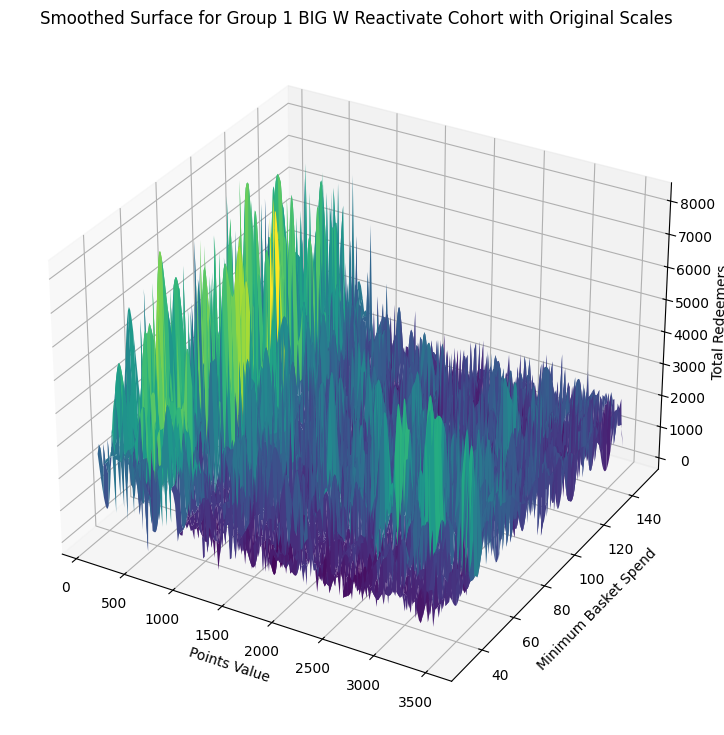

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from scipy.interpolate import griddata

# Assume df_combinations is your DataFrame 
filtered_df = df_combinations[df_combinations['CustomerSegment'] == 'Reactivate']

points = filtered_df[['points_value', 'minimum_basket_spend']].values
values = filtered_df['pred_Redeemers'].values

# Apply PCA
pca = PCA(n_components=2)
points_reduced = pca.fit_transform(points)

# Create grid values for interpolation with higher resolution
# Increase the number of points by using e.g., 200j or 300j instead of 100j
grid_x, grid_y = np.mgrid[
    points_reduced[:, 0].min():points_reduced[:, 0].max():200j, 
    points_reduced[:, 1].min():points_reduced[:, 1].max():200j
]

# Interpolate the values
grid_z = griddata(points_reduced, values, (grid_x, grid_y), method='cubic')

# Inverse transform the grid back to original space
grid_original = pca.inverse_transform(np.c_[grid_x.ravel(), grid_y.ravel()])
grid_x_orig, grid_y_orig = grid_original[:, 0].reshape(grid_x.shape), grid_original[:, 1].reshape(grid_y.shape)

# Plotting the surface with original scales
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Surface plot in original scale
ax.plot_surface(
    grid_x_orig, grid_y_orig, grid_z, cmap='viridis', edgecolor='none'
)

ax.set_xlabel('Points Value')
ax.set_ylabel('Minimum Basket Spend')
ax.set_zlabel('Total Redeemers')
ax.set_title('Smoothed Surface for Group 1 BIG W Reactivate Cohort with Original Scales')

plt.show()


In [23]:
# THIS PART MAKES IT INTERACTIVE

# Required Libraries
# import numpy as np
# import plotly.graph_objs as go
# from scipy.interpolate import griddata
# import matplotlib.pyplot as plt

# Assuming points_reduced, values, pca, grid_x, and grid_y are already defined

grid_x, grid_y = np.mgrid[
    points_reduced[:, 0].min():points_reduced[:, 0].max():300j, 
    points_reduced[:, 1].min():points_reduced[:, 1].max():300j
]


# Interpolate the values
grid_z = griddata(points_reduced, values, (grid_x, grid_y), method='cubic')


# Inverse transform the grid back to original space
grid_original = pca.inverse_transform(np.c_[grid_x.ravel(), grid_y.ravel()])
grid_x_orig, grid_y_orig = grid_original[:, 0].reshape(grid_x.shape), grid_original[:, 1].reshape(grid_y.shape)

# Create the interactive plot using Plotly
fig = go.Figure(data=[go.Surface(
    x=grid_x_orig,
    y=grid_y_orig,
    z=grid_z,
    colorscale='Viridis'
)])





# Update plot layout
fig.update_layout(
    title='Smoothed Surface for Group 1 BIG W Reactivate Cohort with Original Scales',
    scene=dict(
        xaxis_title='Points Value',
        yaxis_title='Minimum Basket Spend',
        zaxis_title='Total Redeemers'
    ),
    autosize=True,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)

fig.write_html("interactive_chart.html")


# Show the plot
fig.show()

In [23]:
## TRYING TO SAVE THE VARIABLES (NOT QUITE WORKING)

import pickle
import types

# Function to check if an object is serializable
def is_serializable(obj):
    try:
        pickle.dumps(obj)
    except (pickle.PicklingError, AttributeError, TypeError):
        return False
    return True

# Get a dictionary of all global variables, excluding non-serializable objects
variables = {k: v for k, v in globals().items() if not k.startswith('__') and k != 'pickle' and k != 'variables' and is_serializable(v)}

# Save all variables to a pickle file
with open('all_variables.pkl', 'wb') as file:
    pickle.dump(variables, file)

print("All serializable variables saved successfully!")



All serializable variables saved successfully!


In [24]:
# TRYING TO LOAD THE VARIABLES BACK IN (NOT QUITE WORKING)

import dill as pickle

# To load the variables back (in a new session)
with open('all_variables.pkl', 'rb') as file:
    loaded_variables = pickle.load(file)

for name, value in loaded_variables.items():
    print(f"{name} = {value}")

_ih = ['', '## switch to python to do the rest of the analysis\n\n# required \nimport pandas as pd\nimport numpy as np\nfrom google.cloud import bigquery\nfrom sklearn.preprocessing import LabelEncoder\nfrom sklearn.ensemble import GradientBoostingRegressor\nfrom xgboost import XGBRegressor\nimport matplotlib.pyplot as plt\nfrom itertools import product\nfrom sklearn.preprocessing import StandardScaler\nimport pandas_gbq\nimport matplotlib.pyplot as plt\nfrom mpl_toolkits.mplot3d import Axes3D', '# Initialize BigQuery client\nclient = bigquery.Client(project=\'gcp-wow-rwds-ai-pobe-dev\')\n\n# Query\nsql = """\nSELECT * \nFROM `gcp-wow-rwds-ai-pobe-dev.angus.bigw_xmas_modelData2` \n"""\n\n# Execute query and get results as DataFrame\nmodelData = client.query(sql).to_dataframe()\n\n# Dataset Summary\n\n# 1. Column Headers\nprint("Column Headers:")\nprint(modelData.columns.tolist())\n\n# 2. Data Types\nprint("\\nData Types:")\nprint(modelData.dtypes)\n\n# 3. Missing Values\nprint("\\nMiss